# Train and run wflow_sbm surrogate model

The surrogate emulates Actual Evapotranspiration and Volumetric Water Content (top 10 cm) produced from Wflow_sbm over the Alpine region at 1 km spatial resolution and daily time steps. 

The repository offers a very small dataset in the demodata folder. Uncomment the jupyter notebook cell "DEMO" and comment the cell "ALPS" in order to train the model.

The figures at the end of the notebook show the surrogate outputs on the Alps, however the training data are not yet available to reproduce the results.

In [5]:
%load_ext autoreload
%autoreload 2

In [6]:
import torch
import numpy as np
import xarray as xr
from pathlib import Path

import dask

from hython.preprocess import apply_normalization
from hython.sampler import RegularIntervalSampler, DataLoaderSpatialSampler
from hython.utils import missing_location_idx, reconstruct_from_missing, load, store_as_zarr, read_from_zarr
from hython.models.lstm import CustomLSTM

# viz
import matplotlib.pyplot as plt
from hython.viz import plot_sampler
from hython.utils import predict, prepare_for_plotting
from hython.viz import map_bias, map_pbias, map_pearson, map_rmse, map_at_timesteps, ts_compare, plot_sampler, compute_kge_parallel


# Settings

In [7]:
wflow_model =  "alps1km_eobs"

surrogate_experiment_name = "s00001"

HIDDEN = 36

dynamic_names = ["precip", "pet", "temp"] #  WFLOW forcings, input features of the surrogate
static_names = [ 'thetaS', 'thetaR', 'RootingDepth', 'Swood','KsatVer', "Sl"] # WFLOW static parameters, input features of the surrogate
target_names = [ "vwc","actevap","runoff"] # WFLOW outputs, targets of the surrogate

train_start = "2016-01-01"
train_end = "2018-12-31"

test_start = "2019-01-01"
test_end = "2020-12-31"

train_range = slice(train_start,train_end)
test_range = slice(test_start, test_end)

# trained was done with spatial sampling

spatial_sampling = True


# for plotting the metrics

remove_lakes =True


# paths

wd = Path("/mnt/CEPH_PROJECTS/InterTwin/hydrologic_data/surrogate_training")

input_dir_path = Path('/mnt/CEPH_PROJECTS/InterTwin/Wflow/models') / wflow_model

# path to directory to save model weights after training
dp_surrogate_model = Path("/mnt/CEPH_PROJECTS/InterTwin/hydrologic_data/surrogate_model")


surrogate_data = wd / f"{wflow_model}.zarr"

save_dir = Path("/mnt/CEPH_PROJECTS/InterTwin/Wflow/egu")

surrogate_model = dp_surrogate_model / f"{wflow_model}_{surrogate_experiment_name}_{HIDDEN}.pt"

In [8]:
if surrogate_experiment_name == "s0001": # 0.1 %
    print("0.1 %")
    intervals = [12, 12]
    val_origin = [1 ,1 ]
    train_origin = [0, 0]
if surrogate_experiment_name == "s0010":  # 1 %
    print("1 %")
    intervals = [4, 4]
    val_origin = [1, 1]
    train_origin = [0, 0]
if surrogate_experiment_name == "s00001":  # 0.01 %
    print("0.01 %")
    intervals = [36, 36]
    val_origin = [1, 1]
    train_origin = [0, 0]
if surrogate_experiment_name == "s000001":  # 0.001 %
    print("0.001 %")
    intervals = [108, 108]
    val_origin = [64, 64]
    train_origin = [0, 0]

0.01 %


In [9]:
targets = xr.open_dataset(input_dir_path / "run_default" / "output_full.nc", chunks= {"time":200}).sel(layer=1).isel(lat=slice(None, None, -1))

In [10]:
Xd = read_from_zarr(url=surrogate_data , group="xd", multi_index="gridcell").sel(time = train_range).xd
Xs = read_from_zarr(url=surrogate_data , group="xs", multi_index="gridcell").xs
Y = read_from_zarr(url=surrogate_data , group="y", multi_index="gridcell").sel(time = train_range).y

Xd_test = read_from_zarr(url=surrogate_data, group="xd", multi_index="gridcell").sel(time = test_range).xd
Y_test = read_from_zarr(url=surrogate_data, group="y", multi_index="gridcell").sel(time = test_range).y

mask_missing = read_from_zarr(url=surrogate_data, group="mask" ).mask
mask_lake = read_from_zarr(url=surrogate_data, group="mask_lake" ).mask_lake

wflow_lakes = Xs.sel(feat="wflow_lakeareas").unstack()
wflow_dem = Xs.sel(feat="wflow_dem").unstack()
wflow_landuse = Xs.sel(feat="wflow_landuse").unstack()

# train 
Xd = Xd.sel(feat=dynamic_names)
Xs = Xs.sel(feat=static_names)
Y = Y.sel(feat=target_names)

# test 
Y_test = Y_test.sel(feat=target_names)
Xd_test = Xd_test.sel(feat=dynamic_names)

# Model hyper parameters

In [27]:
spatial_batch_size = 256
temporal_sampling_size = 150 
seq_length = 360 # days

hidden_size = HIDDEN

model_params={
    "input_size": len(dynamic_names), 
    "hidden_size": hidden_size, 
    "output_size": len(target_names),
    "number_static_predictors": len(static_names), 

}

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [17]:
# Define the spatial samplers for both training and validation sets. Remeber the subsets should not overlap, so choose different origins.
if spatial_sampling:
    intervals = (10, 10) # every n km
    train_origin = (0, 0)
    val_origin = (5, 5)
    
    spatial_train_sampler = RegularIntervalSampler(intervals = intervals, origin = train_origin)
    spatial_val_sampler = RegularIntervalSampler(intervals = intervals, origin = val_origin) 

    # Apply the samplers: return the cell indices that can be used later in training and validation to sample the whole spatial domain.
    data2d  = wflow_dem.values
    
    sampler_train_meta = spatial_train_sampler.sampling_idx(data2d, mask_missing)
    sampler_val_meta = spatial_val_sampler.sampling_idx(data2d, mask_missing)

    # some useful metadata
    print(sampler_train_meta)

    # check location of training and validation sets
    #_ = plot_sampler(wflow_dem, sampler_train_meta, sampler_val_meta, figsize= (8, 8 ), markersize = 3)
else:
    idx = missing_location_idx(Xs)

    Xd_nomissing = Xd[~idx]
    Xs_nomissing = Xs[~idx]
    Y_nomissing = Y[~idx]

SamplerResult(
 - id_grid_2d: (689, 1177) 
 - idx_sampled_1d: (8142,) 
 - idx_sampled_1d_nomissing: (3795,)) 
 - idx_missing_1d: (431441,) 
 - sampled_grid_dims: (69, 118) 
 - xr_coords: None


In [18]:
# Normalizing
if spatial_sampling:

    # statistics from training
    _, d_m, d_std = apply_normalization(Xd[sampler_train_meta.idx_sampled_1d_nomissing], type = "spacetime", how ='standard')
    _, s_m, s_std = apply_normalization(Xs[sampler_train_meta.idx_sampled_1d_nomissing], type = "space", how ='standard')
    _, y_m, y_std = apply_normalization(Y[sampler_train_meta.idx_sampled_1d_nomissing], type = "spacetime", how ='standard')

    # use statistics from training to normalize test set
    Xs = apply_normalization(Xs, type="space", how="standard",  m1 = s_m, m2 = s_std).compute()
    Xd_test = apply_normalization(Xd_test, type="spacetime", how="standard", m1 = d_m, m2 = d_std).compute()
    Y_test = apply_normalization(Y_test, type="spacetime",how="standard", m1 = y_m, m2 = y_std).compute()
else:
    _, d_m, d_std = apply_normalization(Xd_nomissing, type = "spacetime", how ='standard')
    _, s_m, s_std = apply_normalization(Xs_nomissing, type = "space", how ='standard')
    _, y_m, y_std = apply_normalization(Y_nomissing, type = "spacetime", how ='standard')

    Xd_nomissing = apply_normalization(Xd_nomissing, type="spacetime", how="standard", m1 = d_m, m2 = d_std).compute()
    Xs_nomissing = apply_normalization(Xs_nomissing, type="space", how="standard",  m1 = s_m, m2 = s_std).compute()
    Y_nomissing = apply_normalization(Y_nomissing, type="spacetime",how="standard", m1 = y_m, m2 = y_std).compute()

    Xd_test = apply_normalization(Xd_test, type="spacetime", how="standard", m1 = d_m, m2 = d_std).compute()
    Xs_test = apply_normalization(Xs_test, type="space", how="standard",  m1 = s_m, m2 = s_std).compute()
    Y_test = apply_normalization(Y_test, type="spacetime",how="standard", m1 = y_m, m2 = y_std).compute()

In [19]:
d_m = d_m.compute()
d_std = d_std.compute()
s_m = s_m.compute()
s_std = s_std.compute()
y_m = y_m.compute()
Y_std = y_std.compute()

In [20]:
Xd_test = Xd_test.values
Y_test = Y_test.values
Xs = Xs.values

In [21]:
import geopandas as gpd

df = gpd.read_file("/mnt/CEPH_PROJECTS/InterTwin/hydrologic_data/gis/alps_vector.gpkg").simplify(0.01)

wflow_dem = wflow_dem.rio.write_crs(4326)

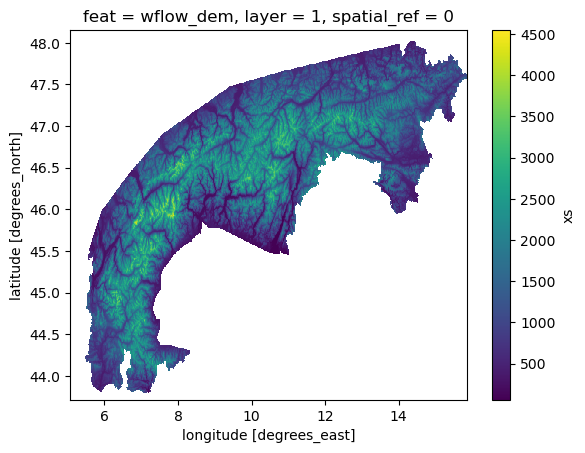

In [22]:
wflow_dem.rio.clip(df.geometry).plot()

# Initialize Model

In [28]:
model = CustomLSTM(**model_params)
model = model.to(device)
model

CustomLSTM(
  (fc0): Linear(in_features=9, out_features=36, bias=True)
  (lstm): LSTM(36, 36, batch_first=True)
  (fc1): Linear(in_features=36, out_features=3, bias=True)
)

In [29]:
model.load_state_dict(torch.load(surrogate_model))

<All keys matched successfully>

# Inference 

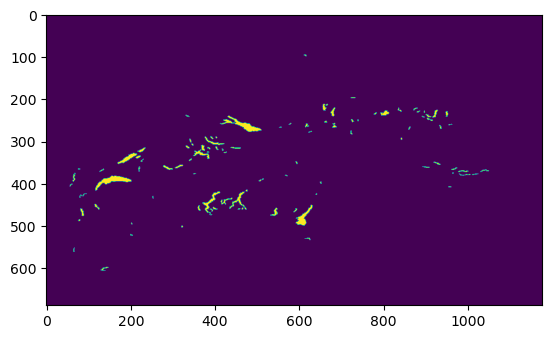

In [30]:
if remove_lakes:
    mask_lakes = (wflow_lakes[::-1].values > 0).astype(np.bool_)
plt.imshow(mask_lakes)

In [31]:
# clusters
def reclass(arr, classes):
    """Returns a 2D array with reclassified values 

    Parameters
    ----------
    arr: NDArray | xr.DataArray
        The input array to be reclassified
    classes: List[int,float]

    Returns
    -------
    """
    if isinstance(arr, xr.DataArray):
        for ic in range(len(classes)):
            print(ic, len(classes)-1)
            if ic < len(classes) - 1:
                arr = arr.where( ~((arr >= classes[ic]) & (arr < classes[ic +1])), ic)
            else:
                arr = arr.where( ~(arr >= classes[ic]), ic)
    return arr
cc_re = reclass(wflow_landuse, [100,200,300,400,500])

0 4
1 4
2 4
3 4
4 4


In [32]:
def metric_agri(da, df, cc_re):
    da = da.rio.write_crs(4326)
    da_agri = da.where(cc_re == 1)
    da_agri = da_agri.rio.clip(df.geometry)
    
    y_agri = da_agri.data.flatten() 
    y_agri = y_agri[~dask.array.isnan(y_agri)]
    return dask.array.percentile(y_agri,[0.1,0.25,0.5,0.75,0.9]).compute() # (mm)
    

In [33]:
# predict over the whole spatial domain using the model trained over the subsample
yhat = predict(Xd_test, Xs, model, spatial_batch_size, device=device)
yhat.shape

lat, lon, time = len(wflow_dem.lat),len(wflow_dem.lon), Xd_test.shape[1]
lat*lon ,time

# to original scale
yhat = (yhat*y_std) + y_m

# SM
y_target_sm, y_pred_sm = prepare_for_plotting(y_target=Y_test[:,:,[0]], y_pred = yhat[:,:,[0]], shape = (lat, lon, time), coords = targets.sel(time=test_range).coords)
y_target_sm.shape

# to original scale
y_target_sm = (y_target_sm*y_std[0]) + y_m[0]

y_target_sm = y_target_sm.chunk({"lat":20, "lon":20, "time":-1})
y_pred_sm = y_pred_sm.chunk({"lat":20, "lon":20, "time":-1})

if remove_lakes:
    y_target_sm = y_target_sm.where(~mask_lakes[...,None])
    y_pred_sm = y_pred_sm.where(~mask_lakes[...,None])

# ET
y_target_et, y_pred_et = prepare_for_plotting(y_target=Y_test[:,:,[1]], y_pred = yhat[:,:,[1]], shape = (lat, lon, time), coords  = targets.sel(time=test_range).coords)
y_target_et.shape

y_target_et = (y_target_et*y_std[1]) + y_m[1]

if remove_lakes:
    y_target_et = y_target_et.where(~mask_lakes[...,None])
    y_pred_et = y_pred_et.where(~mask_lakes[...,None])


if "runoff" in target_names:
    y_target_run, y_pred_run = prepare_for_plotting(y_target=Y_test[:,:,[1]], y_pred = yhat[:,:,[1]], shape = (lat, lon, time), coords  = targets.sel(time=test_range).coords)
    y_target_run.shape
    
    y_target_run = (y_target_run*y_std[2]) + y_m[2]
    
    if remove_lakes:
        y_target_run = y_target_run.where(~mask_lakes[...,None])
        y_pred_run = y_pred_run.where(~mask_lakes[...,None])  

Xs_o = (Xs*s_std)  + s_m



In [34]:
static_names

['thetaS', 'thetaR', 'RootingDepth', 'Swood', 'KsatVer', 'Sl']

In [ ]:
rmse = map_rmse(y_target_run, y_pred_run, figsize = (12, 12), return_rmse=True)

In [ ]:
ts_compare(y_target_run, y_pred_run, lat = [46.4, 45, 46.5, 49, 46], lon = [11.4, 10, 10,12,8], bkg_map=wflow_dem)

# SM,  RMSE. first layer is 10mm. 

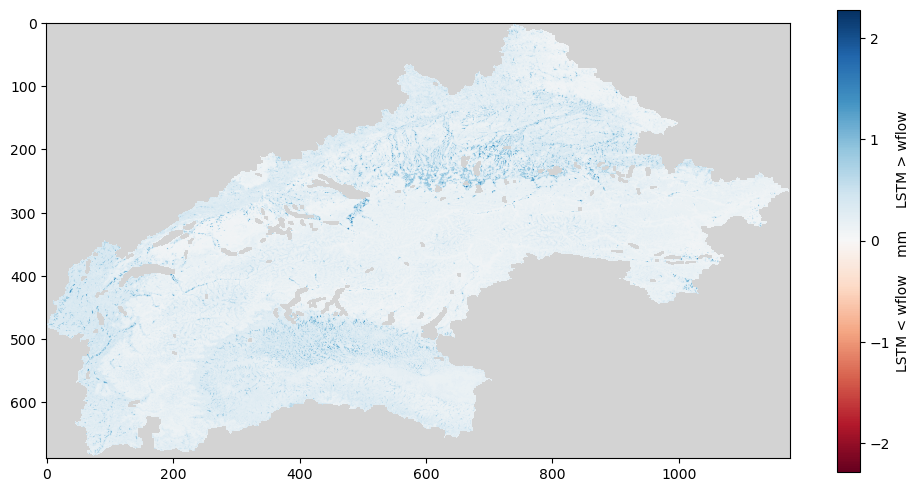

In [55]:
rmse = map_rmse(y_target_sm*10, y_pred_sm*10, figsize = (12, 12), return_rmse=True)

In [68]:
y = rmse.data.flatten() 
y_n = y[~dask.array.isnan(y)]

In [69]:
dask.array.percentile(y_n,[0,1,10,25,50,75,90, 99,100]).compute() # (mm)

array([0.05500792, 0.08094963, 0.11573502, 0.15604404, 0.22784908,
       0.3296772 , 0.63651654, 1.41758687, 2.28253889])


KeyboardInterrupt



Error in callback <function _draw_all_if_interactive at 0x7f172b03d760> (for post_execute), with arguments args (),kwargs {}:



KeyboardInterrupt



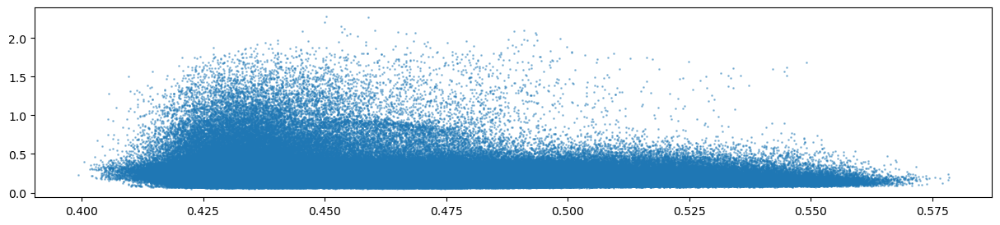

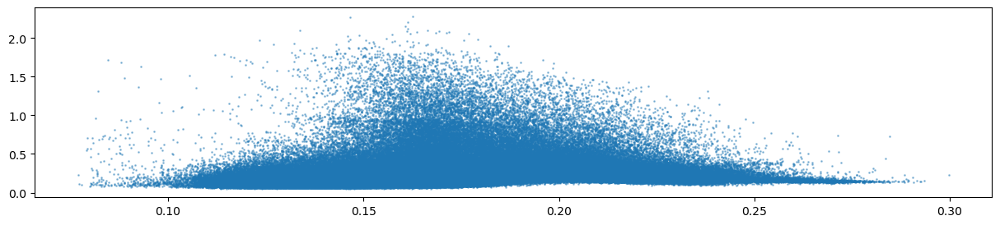

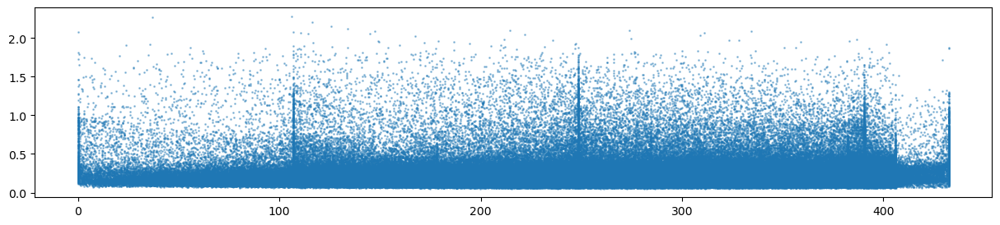

Error in callback <function flush_figures at 0x7f17197bf4c0> (for post_execute), with arguments args (),kwargs {}:



KeyboardInterrupt



In [70]:
for i,sname in enumerate(static_names): 
    plt.figure(figsize=(20,2))
    plt.scatter(Xs_o[...,i].flatten(), y ,s =1, alpha = 0.4)
    plt.title(sname)

# SM,  RMSE, Agriculture on Alps. first layer is 10mm. 

In [89]:
rmse = rmse.rio.write_crs(4326)
rmse_agri = rmse.where(cc_re == 1)
rmse_agri = rmse_agri.rio.clip(df.geometry)

In [90]:
y_agri = rmse_agri.data.flatten() 
y_agri = y_agri[~dask.array.isnan(y_agri)]
dask.array.percentile(y_agri,[0,1,10,25,50,75,90, 99,100]).compute() # (mm)

array([0.06086216, 0.06410332, 0.06931741, 0.10058696, 0.25665543])

# KGE SM

In [91]:
kge_sm = compute_kge_parallel(y_target_sm*10, y_pred_sm*10).compute()

/home/iferrario/.local/miniforge/envs/emulator/lib/python3.11/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/iferrario/.local/miniforge/envs/emulator/lib/python3.11/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


In [ ]:
kge_sm = kge_sm.chunk({"kge":1})

kge_kge_sm = kge_sm.sel(kge="kge")

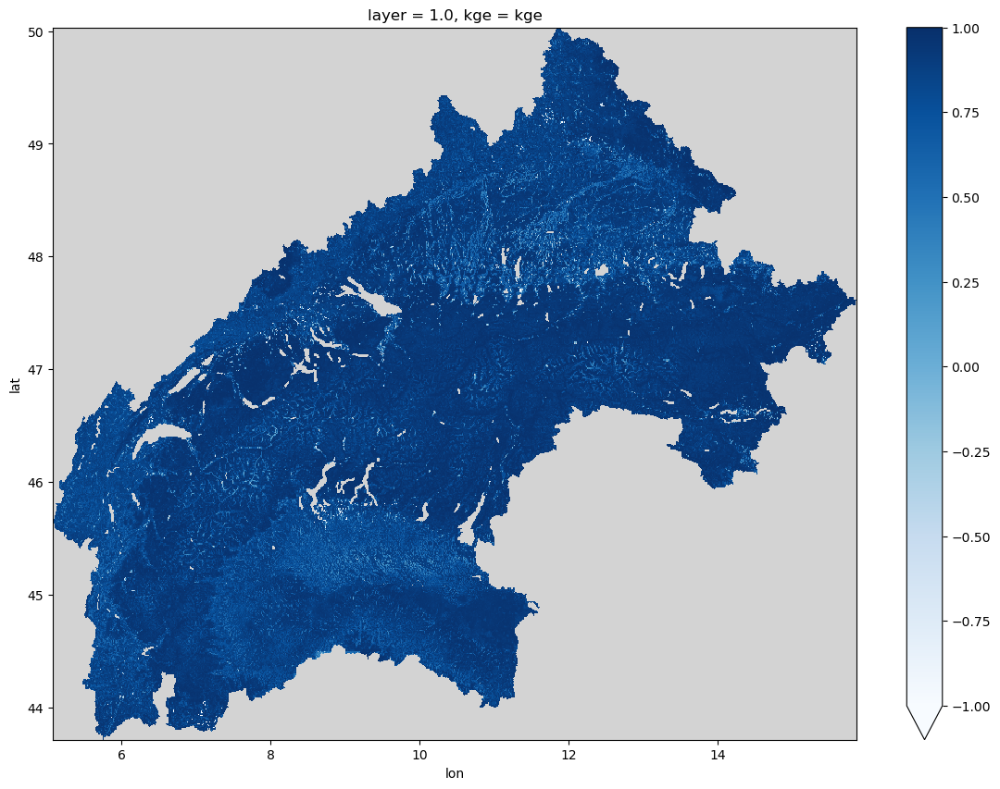

In [94]:
cmap = plt.colormaps['Blues']
cmap.set_bad("lightgrey")
kge_kge_sm.plot(cmap=cmap,figsize=(14,10), vmin=-1, vmax=1)

In [95]:
y = kge_kge_sm.data.flatten() 
y = y[~dask.array.isnan(y)]

In [101]:
dask.array.percentile(y,[0,1,10,25,50,75,90, 99,100]).compute() # (mm)

array([-4.8914379 ,  0.25371623,  0.72785919,  0.847196  ,  0.91365296,
        0.94858102,  0.96755689,  0.98498762,  0.99408501])

# KGE SM, Agriculture on Alps. first layer is 10mm. 

In [98]:
kge_kge_sm = kge_kge_sm.compute()
kge_kge_sm = kge_kge_sm.rio.set_spatial_dims(y_dim="lat",x_dim="lon").rename({"lat":"y", "lon":"x"})
kge_kge_sm = kge_kge_sm.rio.write_crs(4326)

In [99]:
def metric_agri(da, df, cc_re):
    da = da.rio.write_crs(4326)
    da_agri = da.where(cc_re == 1)
    da_agri = da_agri.rio.clip(df.geometry)
    
    y_agri = da_agri.data.flatten() 
    y_agri = y_agri[~dask.array.isnan(y_agri)]
    return dask.array.percentile(y_agri,[0,1,10,25,50,75,90, 99,100]).compute() # (mm)

In [100]:
metric_agri(kge_kge_sm, df, cc_re.rename({"lat":"y", "lon":"x"}).chunk({"x":10}))

array([-0.43013754,  0.42215903,  0.78995421,  0.87708342,  0.94514928,
        0.97077673,  0.98146321,  0.98961646,  0.99305848])

In [ ]:
plt.figure(figsize=(20,5))
plt.scatter(Xs_o[...,2].flatten(), kge_kge_sm.values, s=1, alpha=0.3)
#plt.hexbin(wflow_dem.values.flatten(), kge[...,0].values.flatten(), bins=1000,gridsize=1000)

In [1]:
Xd.feat

NameError: name 'Xd' is not defined

In [ ]:
p = Xd_o.sel(feat="pet").mean("time")

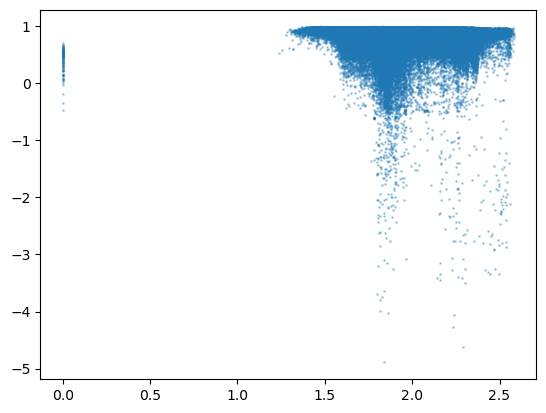

In [133]:
plt.scatter(p.values.flatten(), kge_kge_sm.values, s=1, alpha=0.3)

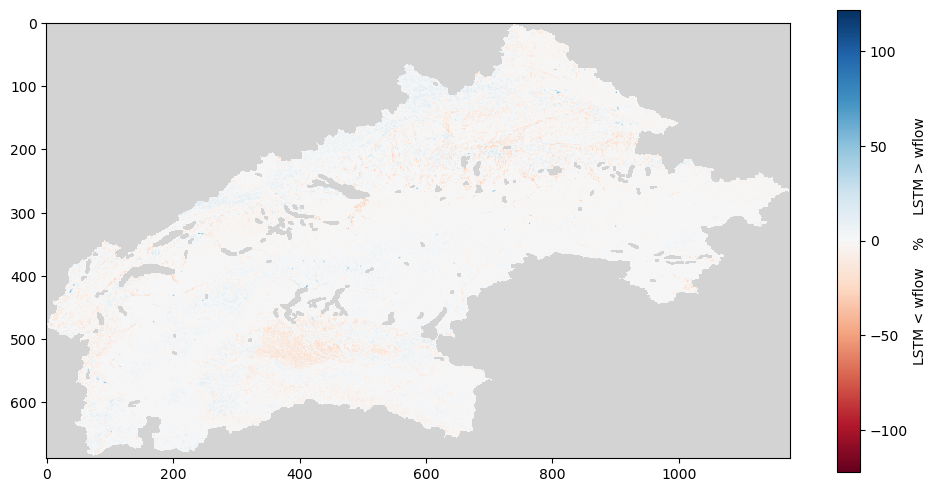

In [49]:
# map percent bias
pbias = map_pbias(y_target, y_pred, figsize = (12, 12), kwargs_imshow = {}, return_pbias=True)

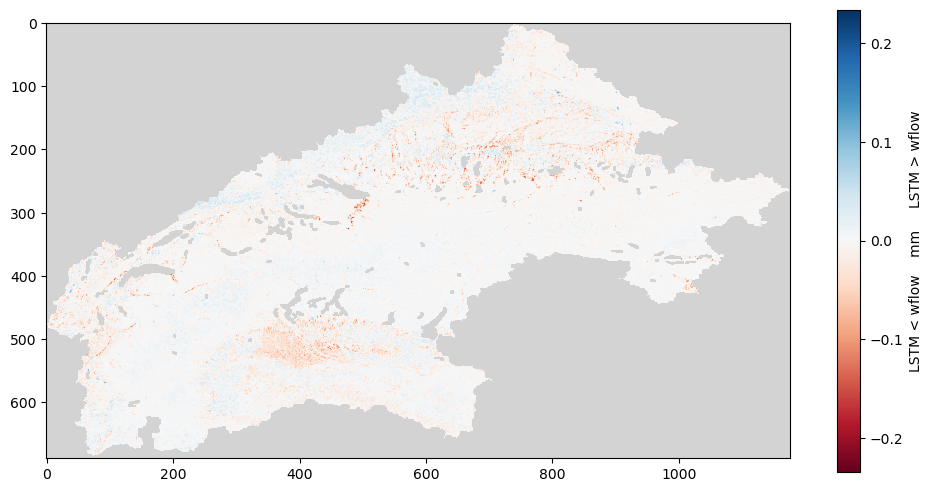

In [38]:
bias = map_bias(y_target, y_pred, figsize = (12, 12), return_bias=True)

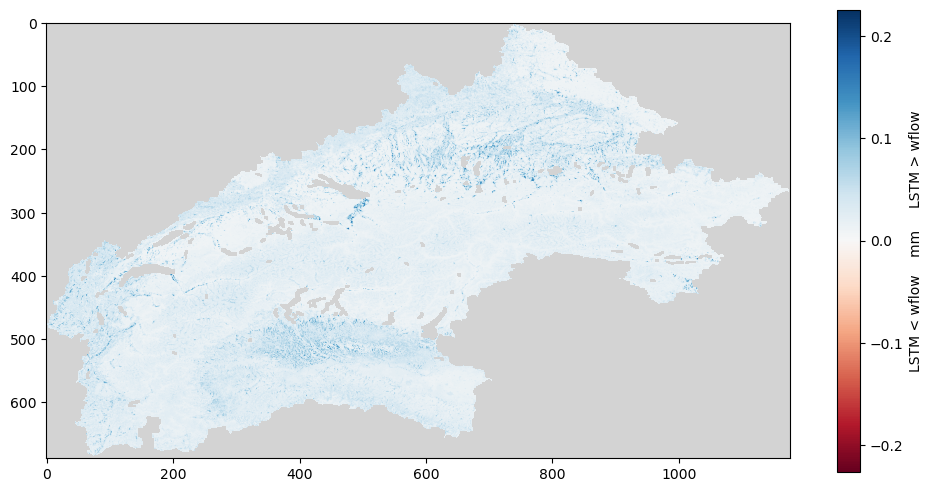

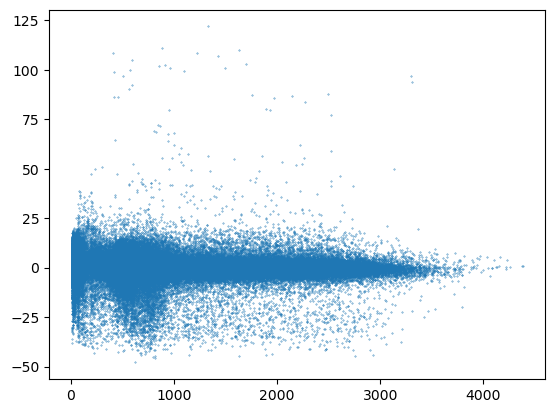

In [ ]:
plt.scatter(wflow_dem.values.flatten(), pbias.values.flatten(), s=0.1, alpha=1)

0 4
1 4
2 4
3 4
4 4


In [ ]:
dd = bias.to_dataset(name="pbias")
#dd = kge[...,0].to_dataset(name="kge")
dd["landuse"] =  cc_re

df = dd.to_dataframe().dropna().reset_index().drop(["layer", "spatial_ref","lat","lon"], axis=1)

import seaborn as sns

sns.boxenplot(df,x="landuse", y="pbias")

In [266]:
# map bias
#map_bias(y_target, y_pred, figsize = (12, 12))

In [267]:
# correlation
# map_pearson(y_target, y_pred)

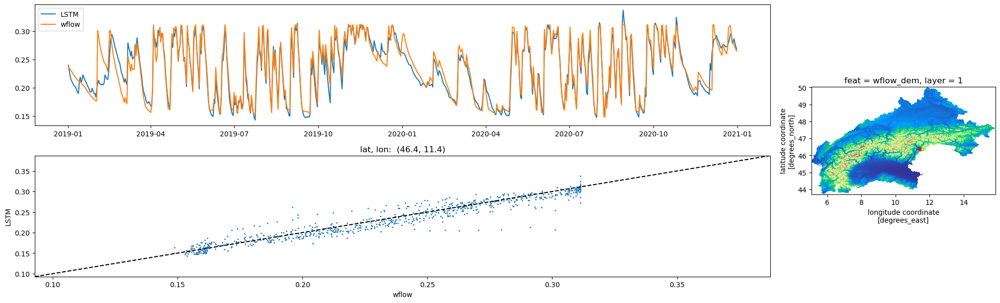

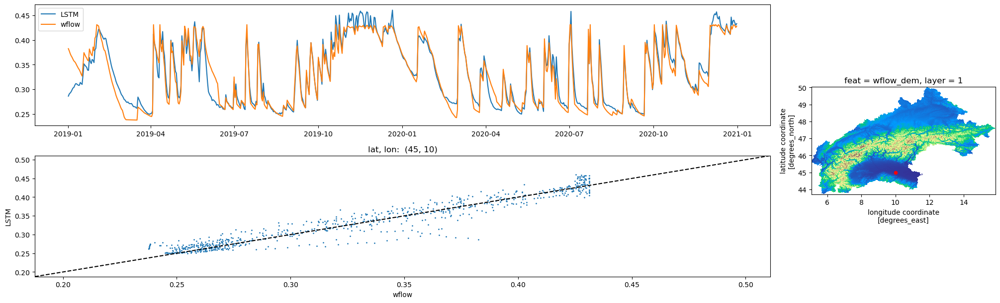

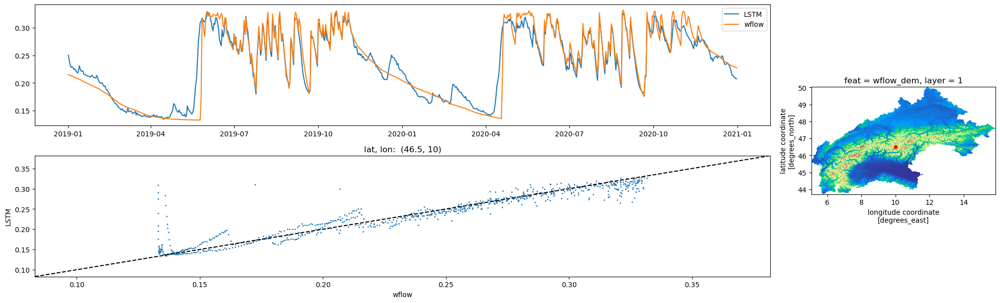

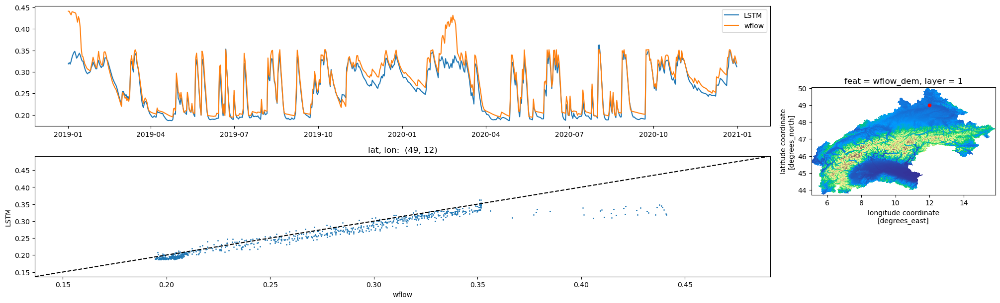

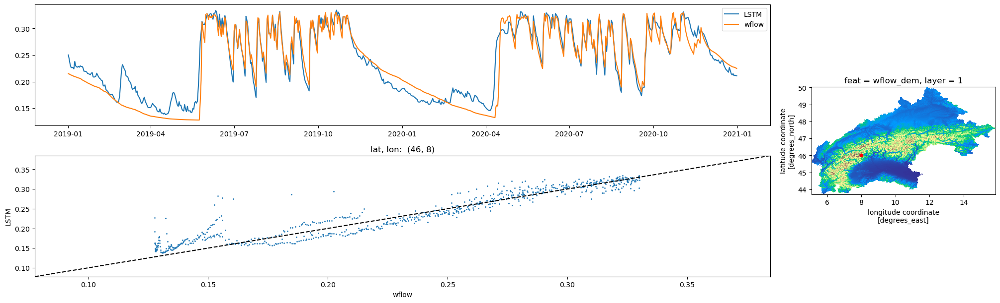

In [40]:
ts_compare(y_target, y_pred, lat = [46.4, 45, 46.5, 49, 46], lon = [11.4, 10, 10,12,8], bkg_map=wflow_dem)

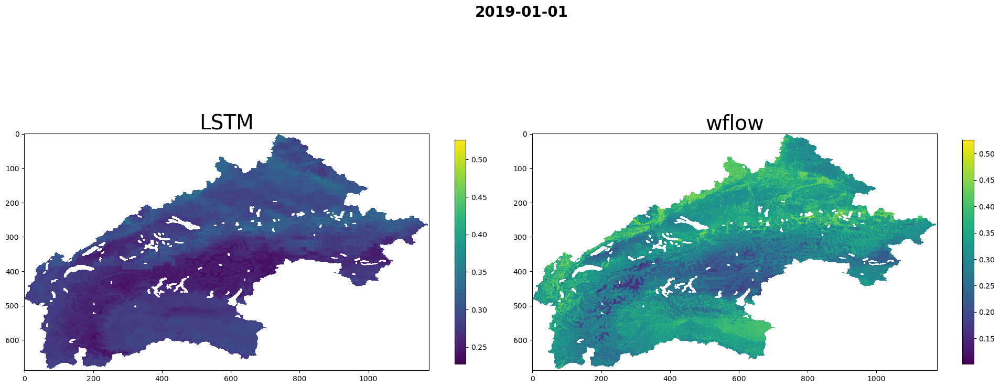

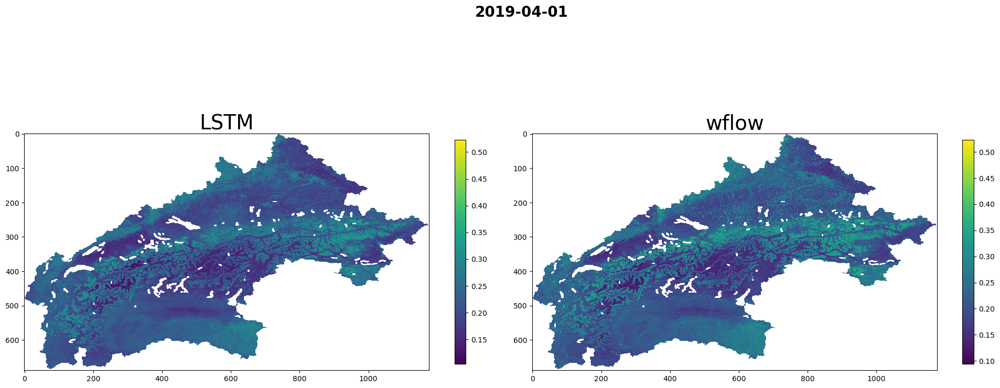

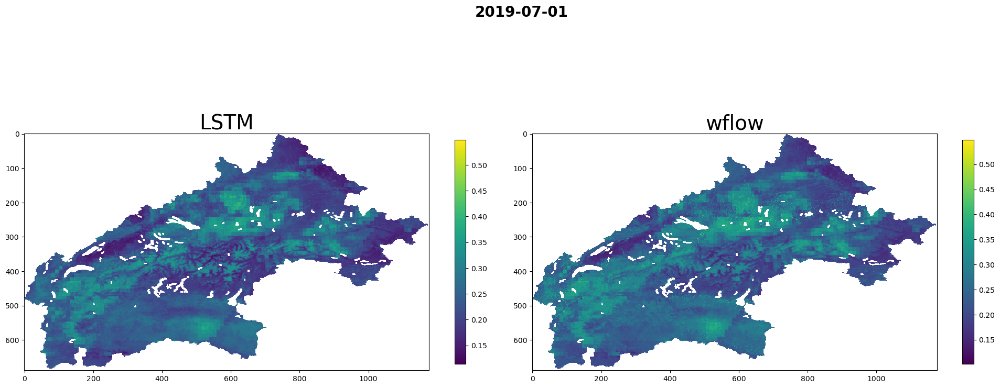

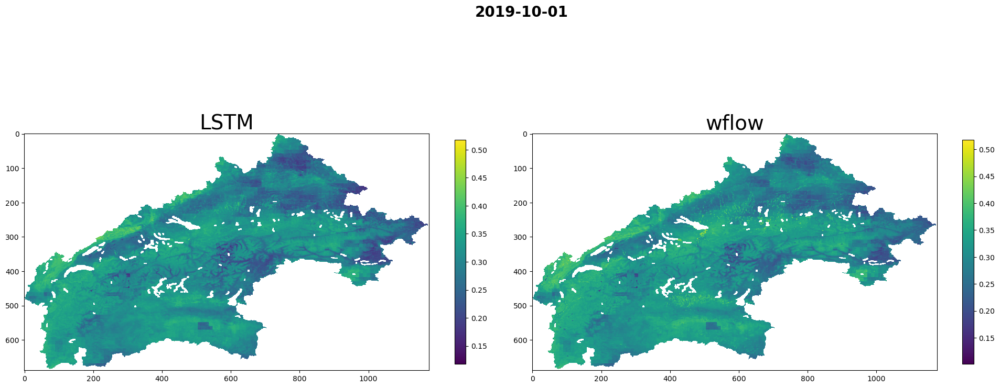

In [41]:
map_at_timesteps(y_target, y_pred,dates=["2019-01-01","2019-04-01", "2019-07-01", "2019-10-01"])

## ET

/home/iferrario/.local/miniforge/envs/emulator/lib/python3.11/site-packages/dask/core.py:127: RuntimeWarning: divide by zero encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


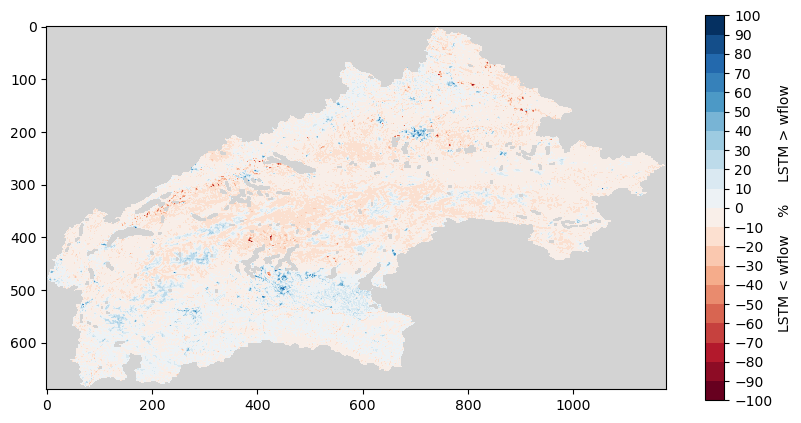

In [45]:
map_pbias(y_target_et, y_pred_et, figsize = (10, 10), kwargs_imshow = {"vmin":-100, "vmax":100 })

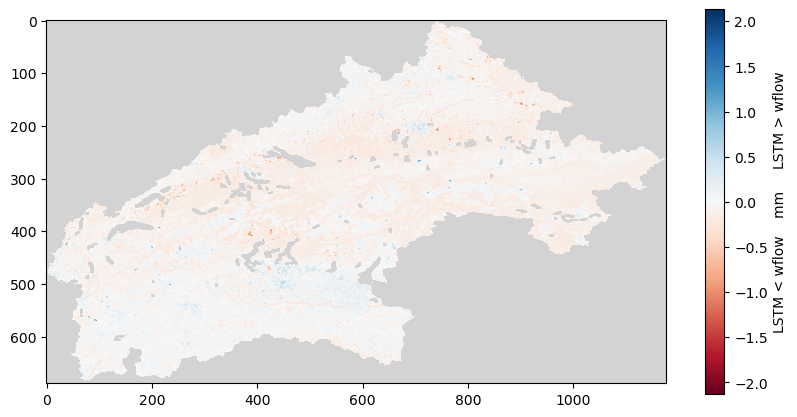

In [46]:
map_bias(y_target_et, y_pred_et, figsize = (10, 10))

In [140]:
kge = xr.apply_ufunc(compute_kge, y_pred_et, y_target_et, 
                     input_core_dims=[["time"],["time"]] , 
                     output_core_dims= [["kge"]], 
                     output_dtypes=[float],
                     vectorize=True,
                     dask="parallelized",
                     dask_gufunc_kwargs = {"output_sizes":{"kge":4}}
                    )
kge  = kge.compute()
kge = kge.assign_coords({"kge":["kge","r", "alpha", "beta"]})

/home/iferrario/.local/miniforge/envs/emulator/lib/python3.11/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/iferrario/.local/miniforge/envs/emulator/lib/python3.11/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


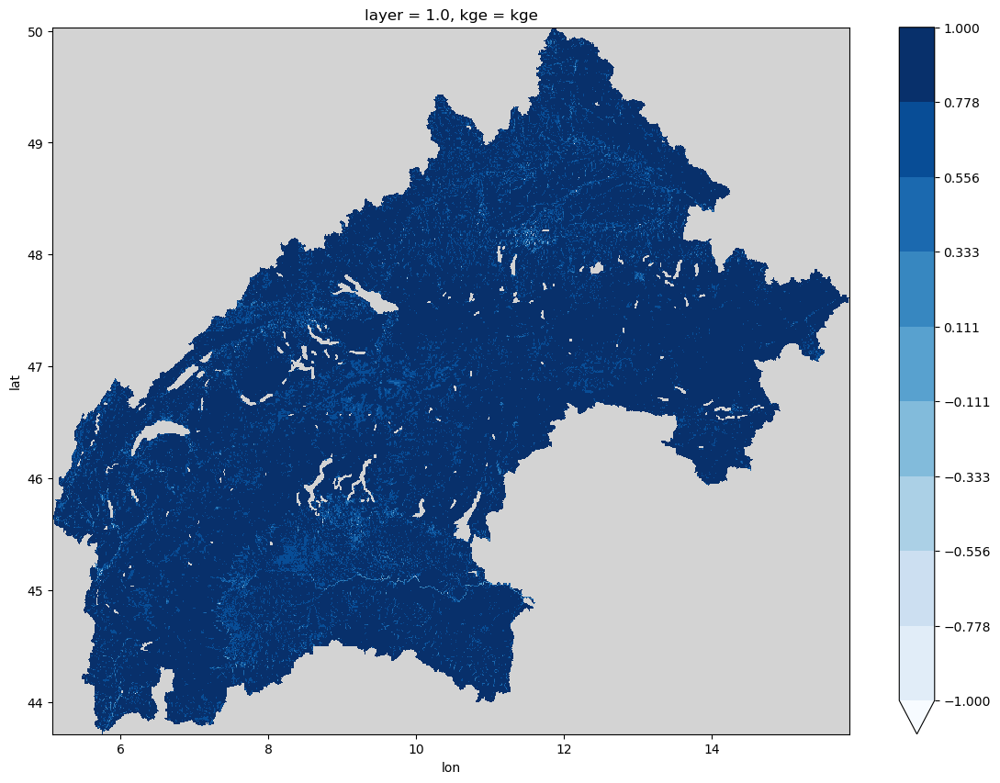

In [141]:
kge[...,0].plot(cmap=cmap,figsize=(14,10), levels=10, vmax=1)

In [76]:
plt.figure(figsize=(20,5))
plt.scatter(wflow_dem.values.flatten(), kge[...,0].values.flatten(), s=1, alpha=1)

NameError: name 'kge' is not defined

<Figure size 2000x500 with 0 Axes>

/home/iferrario/.local/miniforge/envs/emulator/lib/python3.11/site-packages/seaborn/_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


<AxesSubplot: xlabel='landuse', ylabel='pbias'>

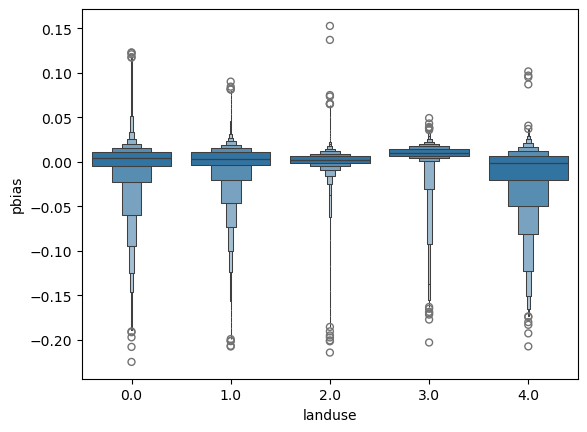

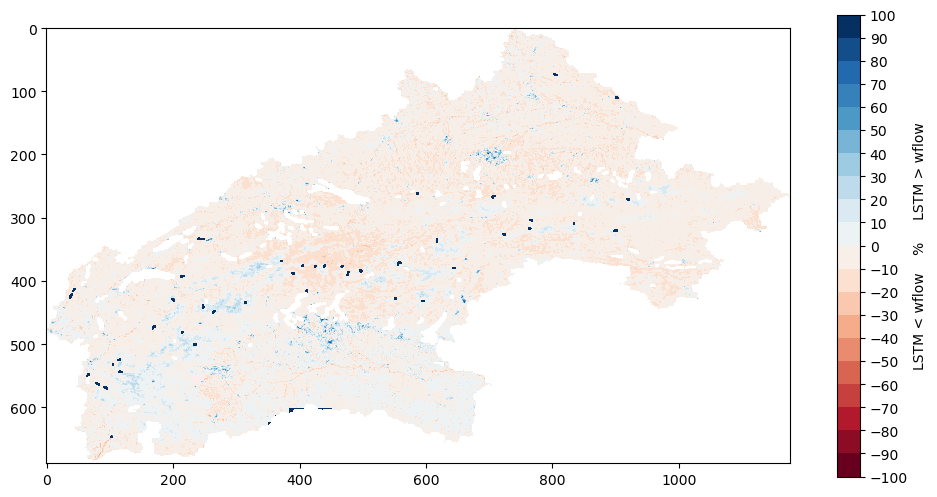

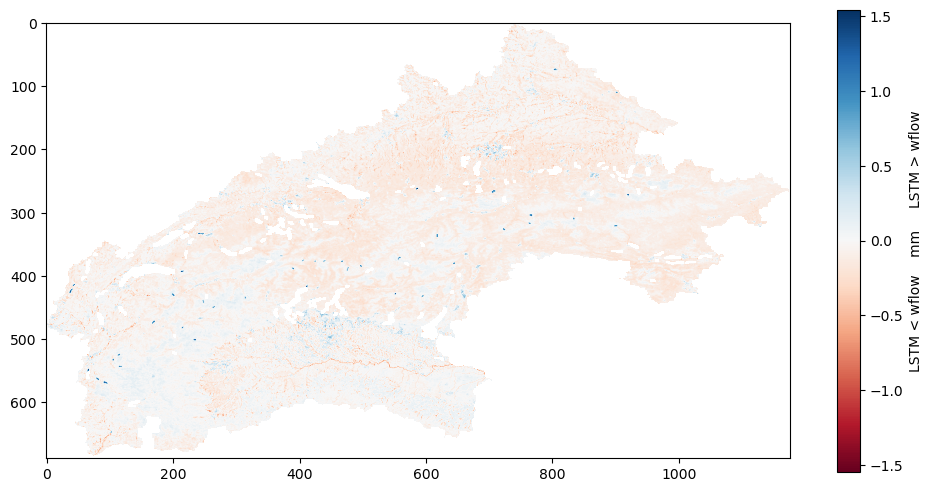

In [146]:
pbias = map_pbias(y_target_et, y_pred_et, figsize = (12, 12), kwargs_imshow = {"vmin":-100, "vmax":100 }, return_pbias=True)
bias = map_bias(y_target_et, y_pred_et , figsize = (12, 12), return_bias=True)

In [163]:
#dd = bias.to_dataset(name="pbias")
dd = kge[...,1].to_dataset(name="pbias")
dd["landuse"] =  cc_re

df = dd.to_dataframe().dropna().reset_index().drop(["layer", "spatial_ref","lat","lon"], axis=1)

import seaborn as sns

/home/iferrario/.local/miniforge/envs/emulator/lib/python3.11/site-packages/seaborn/_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


<AxesSubplot: xlabel='landuse', ylabel='pbias'>

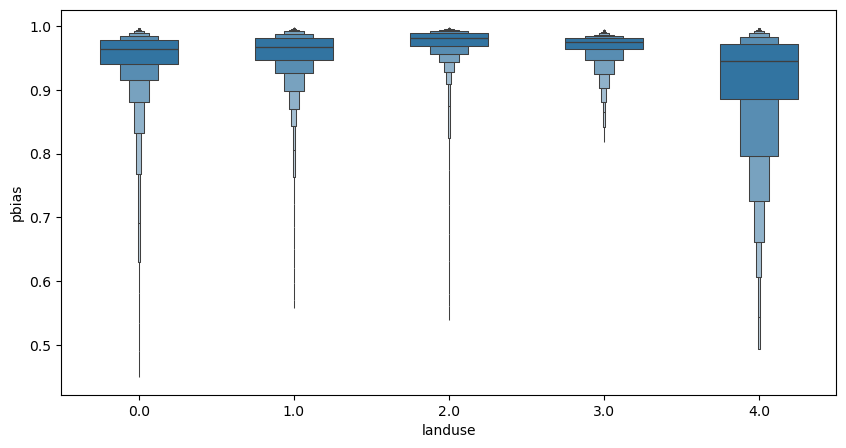

In [176]:
plt.figure(figsize=(10,5))
sns.boxenplot(df,x="landuse", y="pbias",showfliers=False,width=0.5,)

In [42]:
# correlation
# map_pearson(y_target_et, y_pred_et)

In [ ]:
ts_compare(y_target_et, y_pred_et, lat = [46.4, 45, 46.5, 49, 46], lon = [11.4, 10, 10,12,8], bkg_map=wflow_dem)

In [ ]:
#plt.plot(np.unique(y_pred_et))

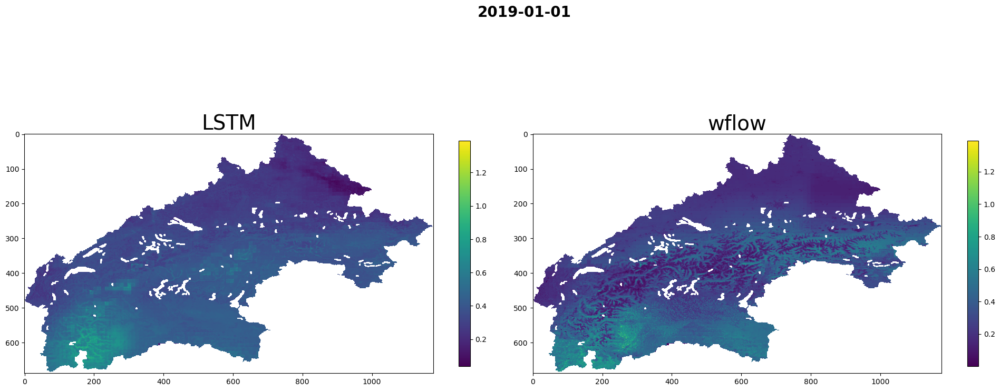

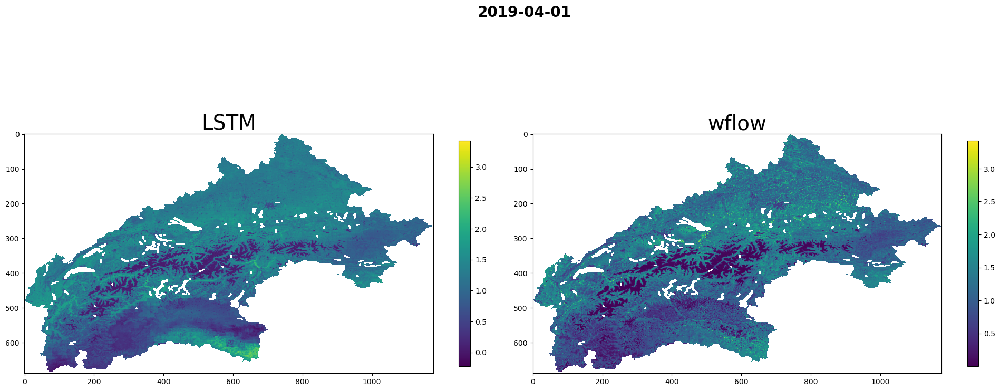

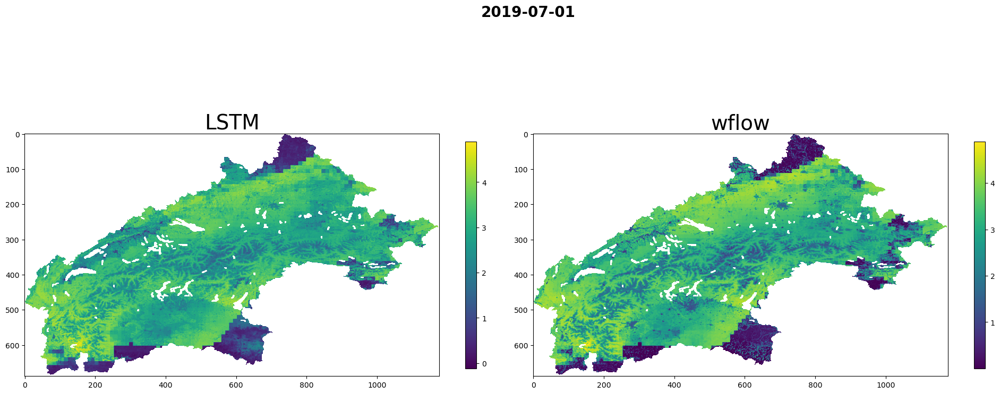

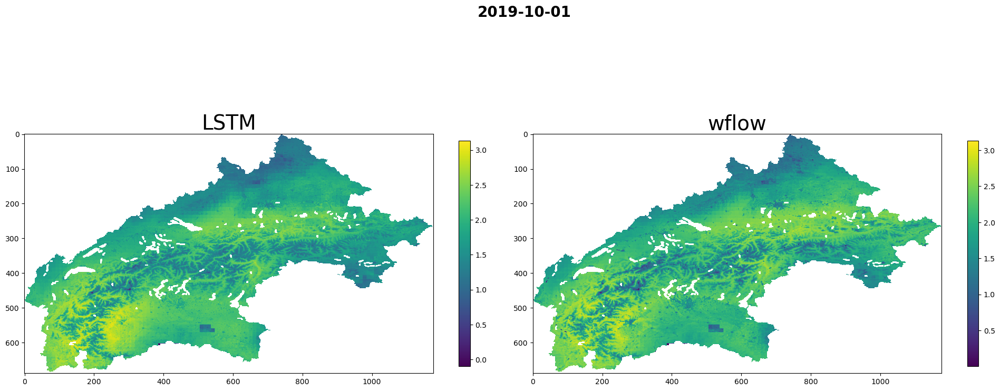

In [47]:
map_at_timesteps(y_target_et, y_pred_et,dates=["2019-01-01","2019-04-01", "2019-07-01", "2019-10-01"])

# EGU

In [2]:
import pandas as pd
import json

## Seeds, data sampling size and summary metrics

In [9]:
def get_metric(df, metric, columns, columns_filter):
    rmse_et = []
    rmse_sm = []
    for i in df:
        rmse_et.append(df[i][metric]["et"])
        rmse_sm.append(df[i][metric]["sm"])
    
    rmse_et = pd.DataFrame(index=k,data=rmse_et, columns=columns).filter(columns_filter,axis=1)
    
    rmse_sm = pd.DataFrame(index=k,data=rmse_sm, columns=columns).filter(columns_filter,axis=1)
    
    rmse_sm.columns = c
    
    rmse_et.columns = c

    return rmse_sm, rmse_et
    
def get_out(wflow_model, experiment):
    
    
    fp = save_dir / "out" / f"{wflow_model}_{experiment}.json"
    
    with open(fp, "r") as f:
        df = json.load(f)  
    return df

In [112]:
df_s000001 = get_out(wflow_model = "alps1km_eobs",experiment =  "s000001")
df_s00001 = get_out(wflow_model = "alps1km_eobs",experiment = "s00001")
df_s0001 = get_out(wflow_model = "alps1km_eobs",experiment =  "s0001")
df_s0010 = get_out(wflow_model = "alps1km_eobs",experiment =  "s0010")

FileNotFoundError: [Errno 2] No such file or directory: '/mnt/CEPH_PROJECTS/InterTwin/Wflow/egu/out/alps1km_eobs_s0010.json'

In [12]:
columns = ["0","1","10","25","50","75","90","99","100"]
c = ["whislo","q1","med","q3","whishi"]
columns_filter = ["1","25","50","75","99"]
k = list(df_s00001.keys())
k

['1696', '5135', '9718', '8502', '5405']

In [13]:
# 1 %
# RMSE
rmse_sm_s0010, rmse_et_s0010 = get_metric(df_s0010, "rmse", columns, columns_filter)

# PBIAS
pbias_sm_s0010, pbias_et_s0010 = get_metric(df_s0010, "pbias", columns, columns_filter)

# KGE
kge_sm_s0010, kge_et_s0010 = get_metric(df_s0010, "kge", columns, columns_filter)


# 0.1 %
# RMSE
rmse_sm_s0001, rmse_et_s0001 = get_metric(df_s0001, "rmse", columns, columns_filter)

# PBIAS
pbias_sm_s0001, pbias_et_s0001 = get_metric(df_s0001, "pbias", columns, columns_filter)

# KGE
kge_sm_s0001, kge_et_s0001 = get_metric(df_s0001, "kge", columns, columns_filter)


# 0.01 %
# RMSE
rmse_sm_s00001, rmse_et_s00001 = get_metric(df_s00001, "rmse", columns, columns_filter)

# PBIAS
pbias_sm_s00001, pbias_et_s00001 = get_metric(df_s00001, "pbias", columns, columns_filter)

# KGE
kge_sm_s00001, kge_et_s00001 = get_metric(df_s00001, "kge", columns, columns_filter)


# 0.001 %
# RMSE
rmse_sm_s000001, rmse_et_s000001 = get_metric(df_s000001, "rmse", columns, columns_filter)

# PBIAS
pbias_sm_s000001, pbias_et_s000001 = get_metric(df_s000001, "pbias", columns, columns_filter)

# KGE
kge_sm_s000001, kge_et_s000001 = get_metric(df_s000001, "kge", columns, columns_filter)




In [14]:
def get_boxes(seeds, sm, et):
    boxes = []
    for i, s in enumerate(seeds):
        sm_d = {"label":s, "fliers":[]}
        sm_d.update(sm.loc[s].to_dict())
    
        boxes.append(sm_d)
      
        et_d = {"label":"", "fliers":[]}
        et_d.update(et.loc[s].to_dict())
    
        boxes.append(et_d)
    return boxes 

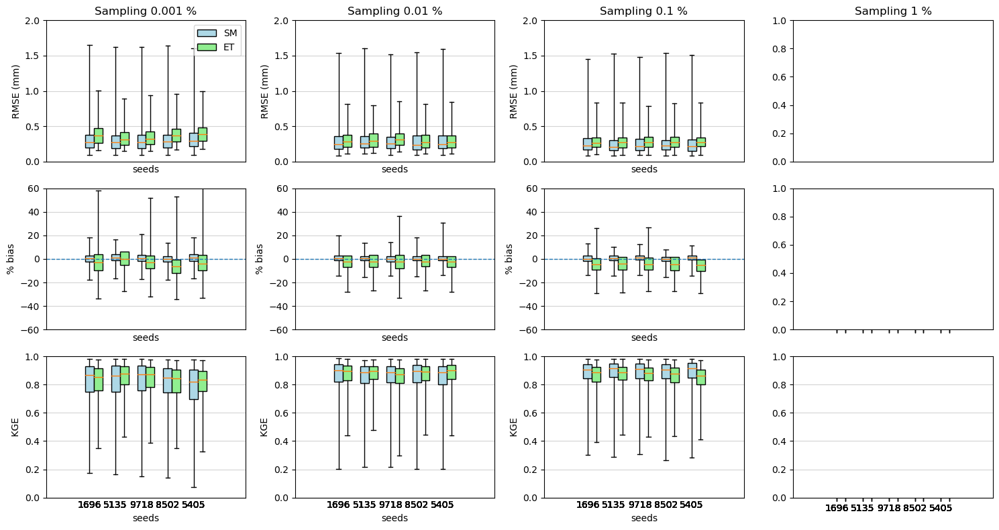

In [15]:
fig, axs = plt.subplots(3,4,figsize=(15,8), sharex=True, sharey=False, tight_layout=True)

axs = axs.flatten()

flierprops = dict(marker='o', markersize=2, linestyle='none')
medianprops = dict(color="red",linewidth=1)
boxprops = dict(color="black",linewidth=1)

positions = [0,0.1, 0.3,0.4, 0.6,0.7, 0.9,1 ,1.2,1.3]
idx_sm = [0, 2, 4, 6, 8]
idx_et = [1,3,5, 7, 9]


seeds = list(rmse_sm_s0001.index)
stats = list(rmse_sm_s0001.columns)


## 0.001

# RMSE

boxes = get_boxes(seeds, rmse_sm_s000001, rmse_et_s000001)
bplot = axs[0].bxp(boxes, showfliers=False,widths=0.1,positions=positions,patch_artist=True)
axs[0].set_ylabel(" RMSE (mm) ")
axs[0].set_xlabel("seeds")
axs[0].set_title("Sampling 0.001 %")
axs[0].tick_params(axis="x",length=0)
axs[0].set_ylim([0,2])
axs[0].grid(axis="y", color="lightgrey")

p1 = bplot["boxes"][0]
p1.set_facecolor("lightblue")
p2 = bplot["boxes"][1]
p2.set_facecolor("lightgreen")
axs[0].legend([p1, p2], ['SM', 'ET'], loc='upper right')

patches =  bplot["boxes"]
for i,p in enumerate(patches):
    if i in idx_sm:
        p.set_facecolor("lightblue")
    if i in idx_et:
        p.set_facecolor("lightgreen")


# PBIAS

boxes = get_boxes(seeds, pbias_sm_s000001, pbias_et_s000001)
bplot = axs[4].bxp(boxes, showfliers=False,widths=0.1,positions=positions,patch_artist=True)
axs[4].set_ylabel(" % bias ")
axs[4].set_xlabel("seeds")
axs[4].tick_params(axis="x",length=0)
axs[4].set_ylim([-60, 60])
axs[4].grid(axis="y", color="lightgrey")

patches =  bplot["boxes"]

for i,p in enumerate(patches):
    if i in idx_sm:
        p.set_facecolor("lightblue")
    if i in idx_et:
        p.set_facecolor("lightgreen")


# KGE

boxes = get_boxes(seeds, kge_sm_s000001, kge_et_s000001)
bplot = axs[8].bxp(boxes, showfliers=False,widths=0.1,positions=positions,patch_artist=True)
axs[8].set_ylabel(" KGE ")
axs[8].set_xlabel("seeds")
axs[8].tick_params(axis="x",length=0)
axs[8].set_ylim([0,1])
axs[8].grid(axis="y", color="lightgrey")

patches =  bplot["boxes"]
for i,p in enumerate(patches):
    if i in idx_sm:
        p.set_facecolor("lightblue")
    if i in idx_et:
        p.set_facecolor("lightgreen")



## 0.01



# RMSE
boxes = get_boxes(seeds, rmse_sm_s00001, rmse_et_s00001)

bplot = axs[1].bxp(boxes, showfliers=False,widths=0.1,positions=positions,patch_artist=True)
axs[1].set_ylabel(" RMSE (mm) ")
axs[1].set_xlabel("seeds")
axs[1].set_title("Sampling 0.01 %")
axs[1].tick_params(axis="x",length=0)
axs[1].set_ylim([0,2])
axs[1].grid(axis="y", color="lightgrey")

patches =  bplot["boxes"]
# fill with colors
for i,p in enumerate(patches):
    if i in idx_sm:
        p.set_facecolor("lightblue")
    if i in idx_et:
        p.set_facecolor("lightgreen")


# PBIAS
boxes = get_boxes(seeds, pbias_sm_s00001, pbias_et_s00001)

bplot = axs[5].bxp(boxes, showfliers=False,widths=0.1,positions=positions,patch_artist=True)
axs[5].set_ylabel(" % bias ")
axs[5].set_xlabel("seeds")
axs[5].tick_params(axis="x",length=0)
axs[5].set_ylim([-60, 60])
axs[5].grid(axis="y", color="lightgrey")

patches =  bplot["boxes"]
# fill with colors
for i,p in enumerate(patches):
    if i in idx_sm:
        p.set_facecolor("lightblue")
    if i in idx_et:
        p.set_facecolor("lightgreen")


# KGE  
boxes = get_boxes(seeds, kge_sm_s00001, kge_et_s00001)

bplot = axs[9].bxp(boxes, showfliers=False,widths=0.1,positions=positions,patch_artist=True)
axs[9].set_ylabel(" KGE ")
axs[9].set_xlabel("seeds")
axs[9].tick_params(axis="x",length=0)
axs[9].set_ylim([0,1])
axs[9].grid(axis="y", color="lightgrey")

patches =  bplot["boxes"]
# fill with colors
for i,p in enumerate(patches):
    if i in idx_sm:
        p.set_facecolor("lightblue")
    if i in idx_et:
        p.set_facecolor("lightgreen")

## 0.1



# RMSE
boxes = get_boxes(seeds, rmse_sm_s0001, rmse_et_s0001)

bplot = axs[2].bxp(boxes, showfliers=False,widths=0.1,positions=positions,patch_artist=True)
axs[2].set_ylabel(" RMSE (mm) ")
axs[2].set_xlabel("seeds")
axs[2].set_title("Sampling 0.1 %")
axs[2].tick_params(axis="x",length=0)
axs[2].set_ylim([0,2])
axs[2].grid(axis="y", color="lightgrey")

patches =  bplot["boxes"]
# fill with colors
for i,p in enumerate(patches):
    if i in idx_sm:
        p.set_facecolor("lightblue")
    if i in idx_et:
        p.set_facecolor("lightgreen")


# PBIAS
boxes = get_boxes(seeds, pbias_sm_s0001, pbias_et_s0001)

bplot = axs[6].bxp(boxes, showfliers=False,widths=0.1,positions=positions,patch_artist=True)
axs[6].set_ylabel(" % bias ")
axs[6].set_xlabel("seeds")
axs[6].tick_params(axis="x",length=0)
axs[6].set_ylim([-60, 60])
axs[6].grid(axis="y", color="lightgrey")

patches =  bplot["boxes"]
# fill with colors
for i,p in enumerate(patches):
    if i in idx_sm:
        p.set_facecolor("lightblue")
    if i in idx_et:
        p.set_facecolor("lightgreen")


# KGE  
boxes = get_boxes(seeds, kge_sm_s0001, kge_et_s0001)

bplot = axs[10].bxp(boxes, showfliers=False,widths=0.1,positions=positions,patch_artist=True)
axs[10].set_ylabel(" KGE ")
axs[10].set_xlabel("seeds")
axs[10].tick_params(axis="x",length=0)
axs[10].set_ylim([0,1])
axs[10].grid(axis="y", color="lightgrey")

patches =  bplot["boxes"]
for i,p in enumerate(patches):
    if i in idx_sm:
        p.set_facecolor("lightblue")
    if i in idx_et:
        p.set_facecolor("lightgreen")

plt.grid(axis="y", color="lightgrey")
## 1 %

# RMSE

axs[3].set_title("Sampling 1 %")
axs[3].tick_params(axis="x",length=0)


In [ ]:
import seaborn as sns

In [72]:
rmse_et_s000001

,whislo,q1,med,q3,whishi
1696,0.154456,0.265872,0.366080,0.468258,1.005052
5135,0.148208,0.238853,0.312541,0.411507,0.888447
9718,0.149488,0.243686,0.324051,0.420784,0.937904
8502,0.164015,0.281168,0.366769,0.463564,0.958160
5405,0.175418,0.288651,0.383752,0.485685,0.999397


In [77]:
kge_contour = [kge_et_s000001["med"].mean(),kge_et_s00001["med"].mean(), kge_et_s0001["med"].mean(), 0.9]
rmse_contour = [rmse_et_s000001["med"].mean(),rmse_et_s00001["med"].mean(), rmse_et_s0001["med"].mean(), 0]
rmse_contour_min = [rmse_et_s000001["whislo"].mean(),rmse_et_s00001["whislo"].mean(), rmse_et_s0001["whislo"].mean(), 0]
rmse_contour_max = [rmse_et_s000001["whishi"].mean(),rmse_et_s00001["whishi"].mean(), rmse_et_s0001["whishi"].mean(), 0]
pbias_contour = [pbias_et_s000001["med"].mean(),pbias_et_s00001["med"].mean(), pbias_et_s0001["med"].mean(), 0.9]

In [78]:
df_plot  = pd.DataFrame({ "sampling":["0.001", "0.01","0.1","1"], "time_per_loop":["0.4", "1.5", "12", "160"],"rmse":rmse_contour, "rmse_low":rmse_contour_min, 
                         "rmse_high":rmse_contour_max,"pbias":pbias_contour, "kge":kge_contour })

In [69]:
def make_pretty(styler):
   styler.background_gradient(axis=0, cmap="RdBu") 
   return styler

In [ ]:
import seaborn as sns
import matplotlib.colors as colors
from matplotlib.colors import BoundaryNorm, CenteredNorm
from matplotlib.ticker import MaxNLocator

cmap = plt.colormaps['Greens']
norm = CenteredNorm(0.5)
norm.vmin = 0
norm.vmax = 1

#df_plot.style.background_gradient(cmap=cmap, low=0.5, high=1)

In [45]:
df_plot.time_per_loop.iloc[1]

'1.5'

/tmp/ipykernel_780091/3866402560.py:8: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  ax[0].legend([a1,a2],labels=["mean","q9-q1"],loc='best',frameon=False) #, bbox_to_anchor=(0.8, 0., 0.4, 1.1))


Text(0.5, 0, 'sampling %')

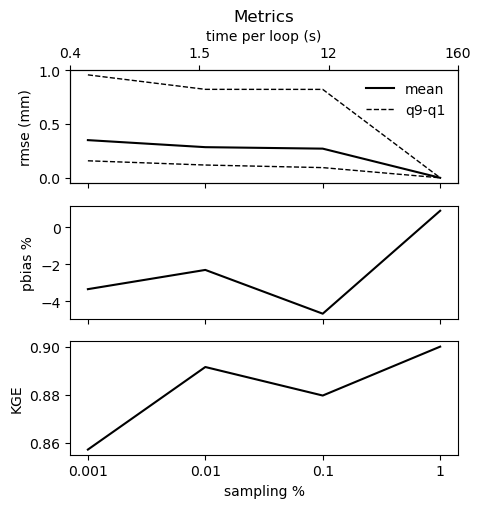

In [100]:
fig, ax = plt.subplots(3,1, sharex=True, figsize=(5,5))

a1=ax[0].plot(df_plot.sampling, df_plot.rmse, color="black")
a2=ax[0].plot(df_plot.sampling, df_plot.rmse_low, color="black", ls="--", lw=1)
a3=ax[0].plot(df_plot.sampling, df_plot.rmse_high, color="black", ls="--", lw=1)
ax[0].set_title("Metrics")
ax[0].set_ylabel("rmse (mm)")
ax[0].legend([a1,a2],labels=["mean","q9-q1"],loc='best',frameon=False) #, bbox_to_anchor=(0.8, 0., 0.4, 1.1))
ax0 = ax[0].twiny()
ax0.set_xticks(ticks=range(len(df_plot.time_per_loop.values)), labels=df_plot.time_per_loop.values)
ax0.set_xlabel('time per loop (s)')

ax[1].plot(df_plot.sampling, df_plot.pbias, color="black")
ax[1].set_ylabel("pbias %")

ax[2].plot(df_plot.sampling, df_plot.kge, color="black")
ax[2].set_ylabel("KGE")
ax[2].set_xlabel("sampling %")

## Time series at points

## Sampling Alps maps

In [113]:
sampler_experiments = {
    "s0010":[(4, 4), (1,1), (0,0)],
    "s0001":[(12, 12), (1,1), (0,0)],
    "s00001":[(36, 36), (1,1), (0,0)],
    "s000001":[(108, 108),(1,1), (0,0)]
}

In [109]:
for k,v in sampler_experiments.items():    
    intervals = v[0]
    train_origin = v[1]
    val_origin = v[2]
    spatial_train_sampler = RegularIntervalSampler(intervals = intervals, origin = train_origin)
    spatial_val_sampler = RegularIntervalSampler(intervals = intervals, origin = val_origin) 
    
    sampler_train_meta = spatial_train_sampler.sampling_idx(data2d, mask_missing)
    sampler_val_meta = spatial_val_sampler.sampling_idx(data2d, mask_missing)

    plot_sampler(wflow_dem, sampler_train_meta, sampler_val_meta, figsize= (8, 8 ), markersize = 3)

NameError: name 'data2d' is not defined